# All Sites Random Forest: Unloading Paper
# Updated Analysis Random Forest Read
## Loading only the random forest model (from rerun) and taking a look at it without reruning anything
* second notebook to perform random forest analysis for the unloading paper
* look at a lot of decision trees

created by Cassie Lumbrazo\
date: April 20245\
python environment: **shap**

latest: running on UAS linux machine


In [13]:
# NOW------ since I am trying to run the SHAP values, we needed to create an SHAP environment with an older version of python... 

## Load Everything

In [14]:
# import packages 
%matplotlib inline

# plotting packages 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns 

sns.set_theme()
# plt.rcParams['figure.figsize'] = [12,6] #overriding size

# data packages 
import pandas as pd
import numpy as np
import xarray as xr

import copy 
import pickle
import sklearn

So, I reran everything in the `Updated_Analysis_Random_Forest_Run.ipynb` notebook.\
Now, everything works with python 3.13.2 and I created new `joblib` and `pkl` files.

In [15]:
from joblib import dump
from joblib import load

filepath = '/home/cassie/data/unloading_regimes_analysis/'
model_joblib = load(filepath + 'updated_analysis_random_forest_model_int_20_1000_flip.joblib') # load it later 

In [16]:
model_joblib

RandomForestClassifier(max_depth=3, n_estimators=1000, n_jobs=15)

Also can load the new pickle file now that the it works with the new python environment and such, 

In [17]:
model_pickle = pickle.load(open(filepath + 'updated_analysis_random_forest_model_int_20_1000_flip.pkl', 'rb')) # rb, reading
model_pickle

RandomForestClassifier(max_depth=3, n_estimators=1000, n_jobs=15)

In [18]:
df = pd.read_csv(filepath + 'updated_analysis_random_forest_model_int_20_1000_results_with_metdata.csv')
df

,Unnamed: 0,shortwave,windspeed,temp,CD,Classification,site,model
0,0,4.930000,1.180000,-3.495000,1.0,Snow Staying,niwot,1
1,1,29.430000,1.735000,-3.325000,1.0,Snow Staying,niwot,1
2,2,124.500000,2.080000,-2.430000,1.0,Snow Staying,niwot,1
3,3,102.040000,2.745000,-3.250000,1.0,Snow Staying,niwot,1
4,4,614.380000,4.595000,-3.350000,1.0,Snow Staying,niwot,0
...,...,...,...,...,...,...,...,...
1645,1645,400.306250,0.770125,2.143021,1.0,Snow Staying,laret,0
1646,1646,605.846250,0.973554,3.865325,1.0,Snow Staying,laret,0
1647,1647,854.292500,1.648042,4.049008,0.0,Snow Unloading,laret,0
1648,1648,902.823333,1.427383,4.768171,0.0,Snow Unloading,laret,0


In [19]:
# load the features used in the model
local_path='/home/cassie/data/unloading_regimes_analysis/'
X_features = pd.read_csv(local_path + "X_randomforestmodel_features.csv")
y_features = pd.read_csv(local_path + "y_randomforestmodel_features.csv")

In [20]:
X_features

,shortwave radiation (W/m2),wind speed (m/s),air temperature (C)
0,4,1,-3
1,29,1,-3
2,124,2,-2
3,102,2,-3
4,614,4,-3
...,...,...,...
1645,400,0,2
1646,605,0,3
1647,854,1,4
1648,902,1,4


## Calculate SHAP Values

In [21]:
import shap

<Figure size 640x480 with 0 Axes>

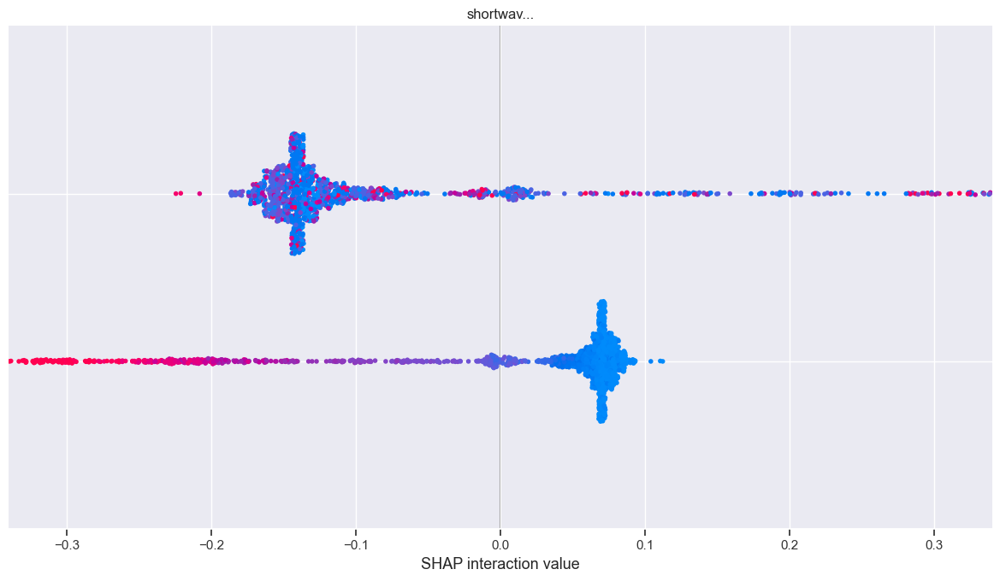

In [22]:
explainer = shap.TreeExplainer(model_joblib)
shap_values = explainer.shap_values(X_features)
shap.summary_plot(shap_values, X_features)

<Figure size 640x480 with 0 Axes>

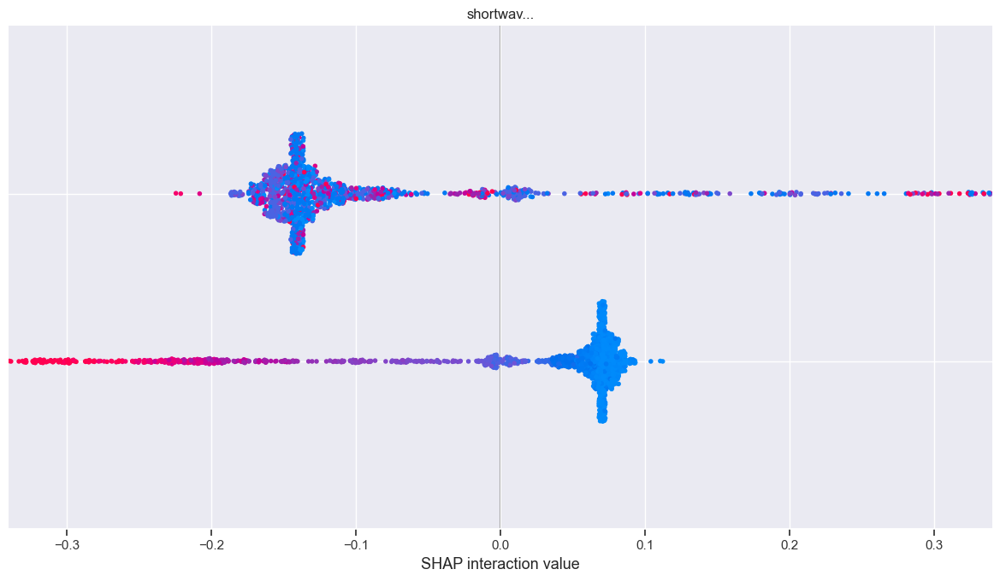

In [23]:
# shap.summary_plot(shap_values, X_features, plot_type="bar", show=True)
shap.summary_plot(shap_values, X_features, plot_type="dot", show=True)

In [24]:
print(type(shap_values))        # Should say: list
print(len(shap_values))         # Number of classes
print(np.shape(shap_values[0])) # SHAP values shape for class 0
print(model_joblib.classes_)

<class 'numpy.ndarray'>
1650
(3, 2)
[0 1]


Meaning we have 1650 samples, with 3 features, and 2 classes (snow staying 0, and snow unloading 1)\
so each 3D array of SHAP values is,\
[samples, features, classes]

Class 0 = snow staying, 

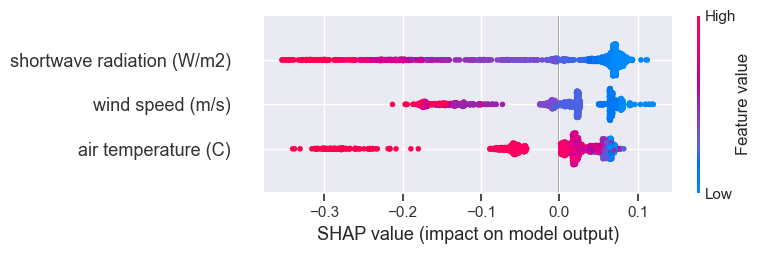

In [25]:
# Get SHAP values for class 1 (i.e., class index 1)
shap_values_class1 = shap_values[:, :, 0]

# Now plot the summary
# increase figure size 
mpl.rcParams['figure.figsize'] = [12, 6]  # Set figure size for summary plot
shap.summary_plot(shap_values_class1, X_features)

Class 1 = snow unloading, 

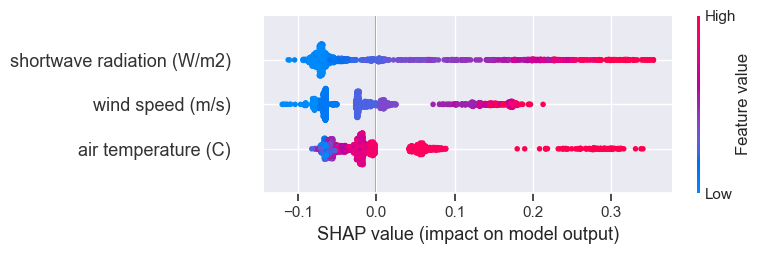

In [26]:
# Get SHAP values for class 1 (i.e., class index 1)
shap_values_class1 = shap_values[:, :, 1]

# Now plot the summary
# increase figure size 
# mpl.rcParams['figure.figsize'] = [12, 6]  # Set figure size for summary plot
shap.summary_plot(shap_values_class1, X_features)

### How to read it:
1. Each dot = one data point (one row in your dataset)
Position along the x-axis = how much that feature pushed the model toward or away from class 1.
* ➕ Right of 0 → the feature increased the likelihood of snow unloading.
* ➖ Left of 0 → the feature decreased the likelihood of snow unloading.

2. Color = feature value
* 🔵 Blue = low value for that feature
* 🔴 Red = high value
* So the color tells you what kind of input caused that SHAP impact.

### Feature-by-feature interpretation:
**Shortwave radiation (W/m²)**
* Blue (low radiation) dots mostly left of zero → low shortwave radiation reduces the chance of unloading
* Red (high radiation) dots mostly right → high shortwave increases the chance of unloading

**Wind speed (m/s)**
* Blue (low wind speed) dots mostly on the left → low wind reduces snow unloading
* Red (high wind) on the right → strong wind increases the chance

**Air temperature (°C)**
* Most of the red (warm) dots are pushing to the right → warmer temps increase the chance of unloading
* Blue (cold air) mostly near zero or negative impact → cold keeps snow in place

In [27]:
nametemperature = "air temperature (C)"
namewindspeed = "wind speed (m/s)"
nameshortwave = "shortwave radiation (W/m2)"

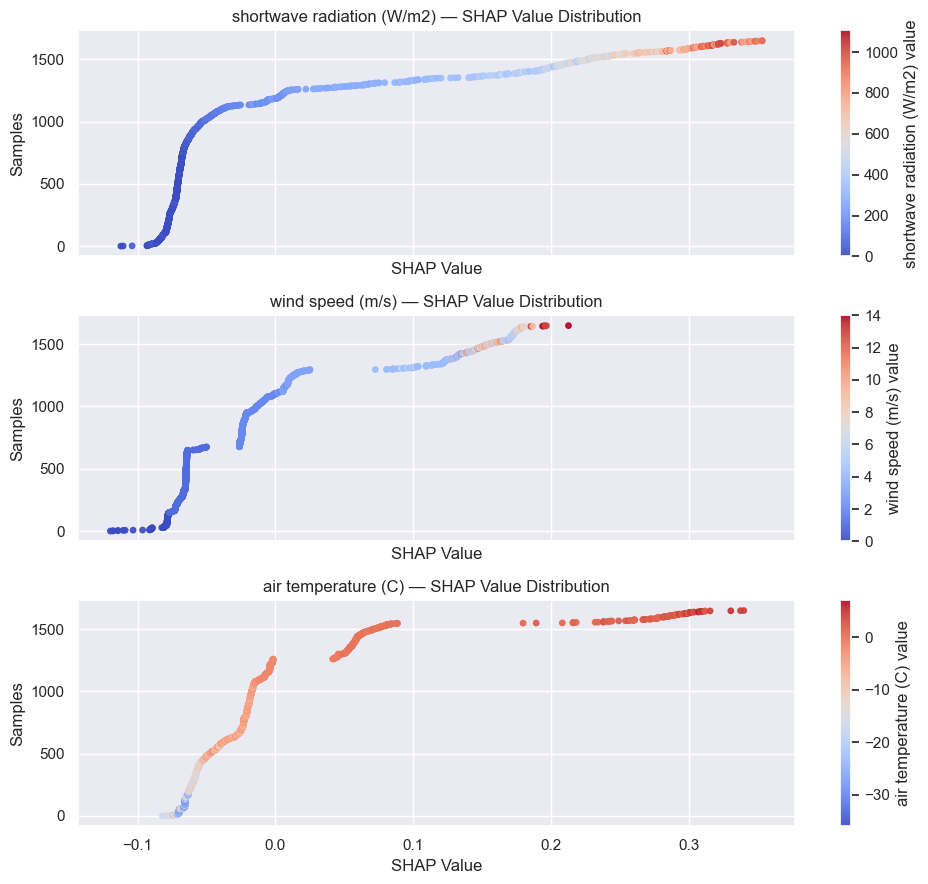

In [43]:
# Create a figure
fig, axes = plt.subplots(n_features, 1, figsize=(10, 3 * n_features), sharex=True)

for i, ax in enumerate(axes):
    feat = feature_names[i]
    shap_vals = shap_values_class1[:, i]
    feat_vals = X_features[feat]

    # Sort by SHAP value magnitude for beeswarm effect
    idx_sorted = np.argsort(shap_vals)
    shap_vals_sorted = shap_vals[idx_sorted]
    feat_vals_sorted = feat_vals.iloc[idx_sorted]

    scatter = ax.scatter(
        shap_vals_sorted,
        np.arange(len(shap_vals_sorted)),
        c=feat_vals_sorted,
        cmap="coolwarm",
        alpha=0.9,
        s=15
    )

    ax.set_title(f"{feat} — SHAP Value Distribution", fontsize=12)
    ax.set_ylabel("Samples")
    ax.set_xlabel("SHAP Value")
    
    # Colorbar for each
    cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
    cbar.set_label(f"{feat} value")

plt.tight_layout()
plt.show()

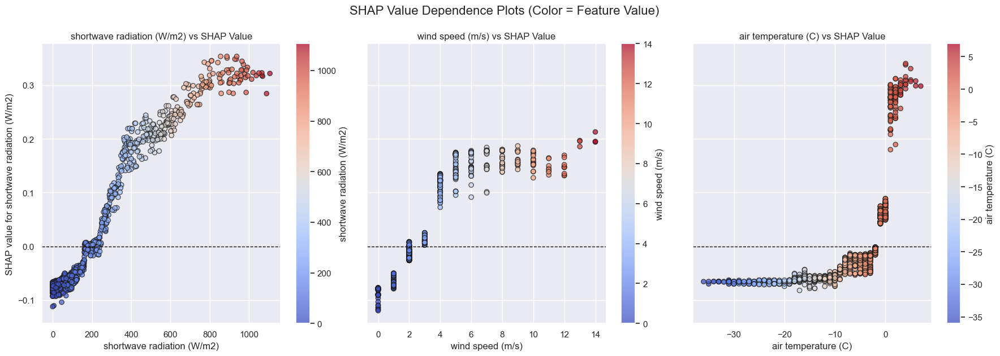

In [42]:
# Set up data
feature_names = X_features.columns.tolist()
n_features = len(feature_names)

# Initialize figure
fig, axes = plt.subplots(1, n_features, figsize=(6 * n_features, 6), sharey=True)

for i, ax in enumerate(axes):
    feat = feature_names[i]
    
    sc = ax.scatter(
        X_features[feat],
        shap_values_class1[:, i],
        c=X_features[feat],
        cmap='coolwarm',
        edgecolor='k',
        alpha=0.7
    )
    
    # add a thick zero line for shap = 0 
    ax.axhline(0, color='black', linewidth=1, linestyle='--')
    
    ax.set_xlabel(feat)
    ax.set_ylabel(f'SHAP value for {feat}' if i == 0 else '')
    ax.set_title(f"{feat} vs SHAP Value")
    
    # Add individual colorbar
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label(f"{feat}")

plt.tight_layout()
plt.suptitle("SHAP Value Dependence Plots (Color = Feature Value)", fontsize=16, y=1.05)
plt.show()

In [28]:
X_features.iloc[:, :]  

,shortwave radiation (W/m2),wind speed (m/s),air temperature (C)
0,4,1,-3
1,29,1,-3
2,124,2,-2
3,102,2,-3
4,614,4,-3
...,...,...,...
1645,400,0,2
1646,605,0,3
1647,854,1,4
1648,902,1,4


In [30]:
shap_values[:, :, 1].shape

(1650, 3)

In [31]:
shap_values

array([[[ 0.06941617, -0.06941617],
        [ 0.06445478, -0.06445478],
        [ 0.01493062, -0.01493062]],

       [[ 0.06621183, -0.06621183],
        [ 0.06463453, -0.06463453],
        [ 0.01479411, -0.01479411]],

       [[ 0.05067823, -0.05067823],
        [ 0.02091133, -0.02091133],
        [ 0.00420729, -0.00420729]],

       ...,

       [[-0.30428559,  0.30428559],
        [ 0.05069105, -0.05069105],
        [-0.30119386,  0.30119386]],

       [[-0.30428559,  0.30428559],
        [ 0.05069105, -0.05069105],
        [-0.30119386,  0.30119386]],

       [[-0.30428559,  0.30428559],
        [ 0.05069105, -0.05069105],
        [-0.30119386,  0.30119386]]], shape=(1650, 3, 2))

In [32]:
X_features[[nameshortwave, nametemperature]]

,shortwave radiation (W/m2),air temperature (C)
0,4,-3
1,29,-3
2,124,-2
3,102,-3
4,614,-3
...,...,...
1645,400,2
1646,605,3
1647,854,4
1648,902,4


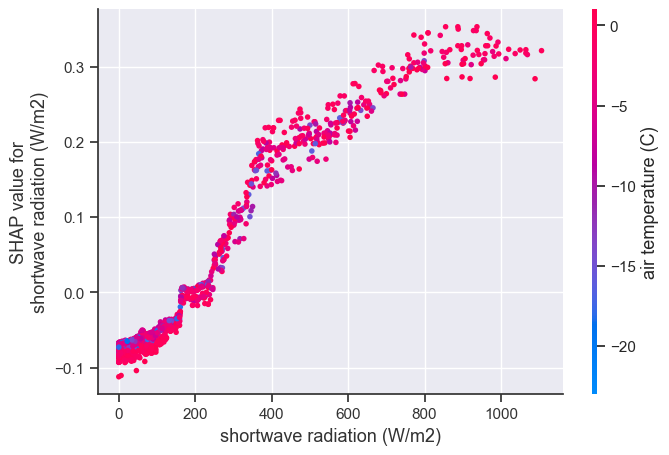

In [33]:
# Correct feature names for shortwave radiation and air temperature
shap.dependence_plot(
    nameshortwave,  # Feature name for x-axis
    shap_values_class1 ,  # SHAP values for class 1 (index 1) and for the second class
    X_features, # Features of interest for the interaction plot
    interaction_index=nametemperature,  # Feature name for interaction
    )


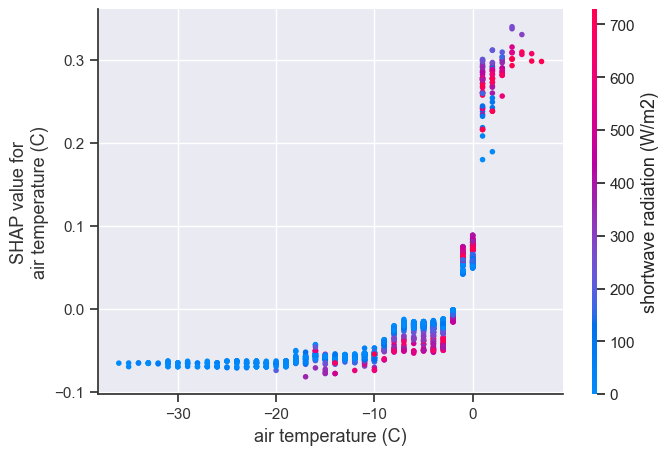

In [34]:
# Correct feature names for shortwave radiation and air temperature
shap.dependence_plot(
    nametemperature,  # Feature name for x-axis
    shap_values_class1 ,  # SHAP values for class 1 (index 1) and for the second class
    X_features, # Features of interest for the interaction plot
    interaction_index=nameshortwave,  # Feature name for interaction
    )


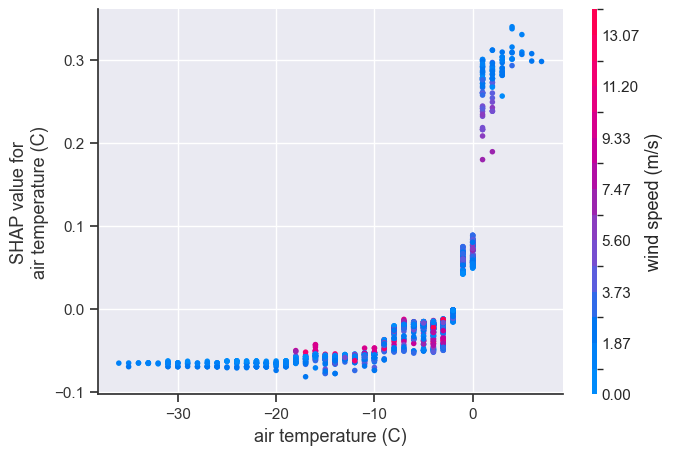

In [35]:
# Correct feature names for shortwave radiation and air temperature
shap.dependence_plot(
    nametemperature,  # Feature name for x-axis
    shap_values_class1 ,  # SHAP values for class 1 (index 1) and for the second class
    X_features, # Features of interest for the interaction plot
    interaction_index=namewindspeed,  # Feature name for interaction
    )


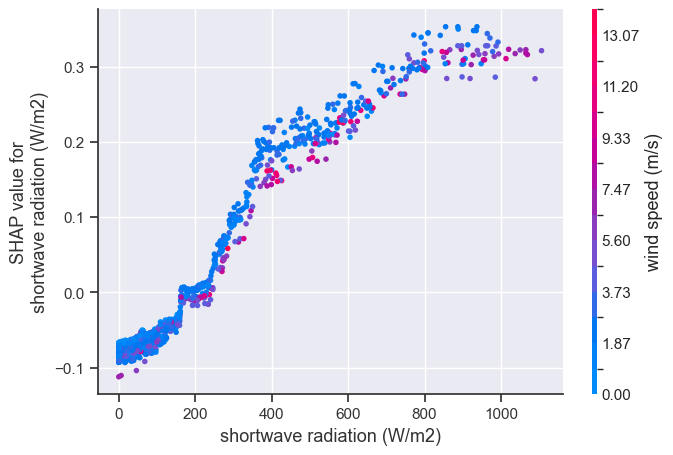

In [36]:
# Correct feature names for shortwave radiation and air temperature
shap.dependence_plot(
    nameshortwave,  # Feature name for x-axis
    shap_values_class1 ,  # SHAP values for class 1 (index 1) and for the second class
    X_features, # Features of interest for the interaction plot
    interaction_index=namewindspeed,  # Feature name for interaction
    )

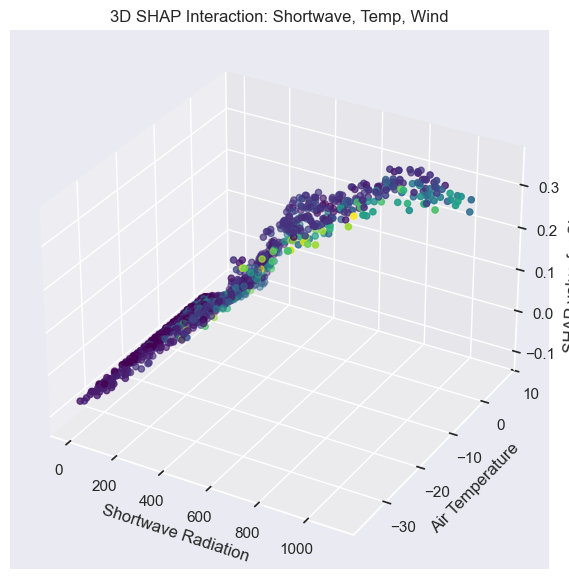

In [37]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    X_features["shortwave radiation (W/m2)"],
    X_features["air temperature (C)"],
    shap_values_class1[:, 0],  # SHAP values for shortwave, for class 1
    c=X_features["wind speed (m/s)"],  # Optional: color by wind speed
    cmap="viridis"
)

ax.set_xlabel("Shortwave Radiation")
ax.set_ylabel("Air Temperature")
ax.set_zlabel("SHAP value for Shortwave")
plt.title("3D SHAP Interaction: Shortwave, Temp, Wind")
plt.show()

In [44]:
# # Combine into a single DataFrame
# df_plot = X_features.copy()
# df_plot["shap_value"] = shap_values_class1[:, 0]  # SHAP for shortwave
# df_plot["wind_bin"] = pd.cut(df_plot["wind speed (m/s)"], bins=[-1, 0, 2, 4, 6])

# # Faceted scatter plots
# g = sns.FacetGrid(df_plot, col="wind_bin", col_wrap=3, height=4)
# g.map_dataframe(sns.scatterplot,
#                 x="shortwave radiation (W/m2)",
#                 y="shap_value",
#                 hue="air temperature (C)",
#                 palette="coolwarm")
# g.set_axis_labels("Shortwave", "SHAP value (shortwave)")
# g.add_legend()
# plt.show()

In [39]:
import plotly.express as px
import pandas as pd

In [40]:
# Create a DataFrame for Plotly
df_plot = pd.DataFrame({
    "shortwave": X_features["shortwave radiation (W/m2)"],
    "temperature": X_features["air temperature (C)"],
    "wind": X_features["wind speed (m/s)"],
    "shap_shortwave": shap_values_class1[:, 0]  # SHAP values for shortwave
})

# Create an interactive 3D scatter plot
fig = px.scatter_3d(
    df_plot,
    x="shortwave",
    y="temperature",
    z="shap_shortwave",
    color="wind",  # Optional: use wind as color dimension
    color_continuous_scale="viridis",
    labels={
        "shortwave": "Shortwave Radiation (W/m2)",
        "temperature": "Air Temperature (°C)",
        "shap_shortwave": "SHAP Value (Shortwave)",
        "wind": "Wind Speed (m/s)"
    },
    title="SHAP Interaction: Shortwave vs Temp vs SHAP Value"
)

fig.update_layout(scene=dict(
    xaxis_title="Shortwave Radiation (W/m2)",
    yaxis_title="Air Temperature (°C)",
    zaxis_title="SHAP Value (Shortwave)"
))

fig.show()